### Customer can understand Price Distribution And Demand in each Area to make a decision.
* Which areas have highest price and what is the demand ratio in that area based on number of reviews? 
* Is there is correlation between demand and price distribution?
* Which option customer should avail if he/she wants to get a cheaper hotel but more rating?
* Which option customer should avail if rating is a priority as compared to price?



### Customer can Understand Relation Between Room Type Provided compared to Price in Each Area
* Is Room type impacting on price? 
* Areas that have more rating , how they vary in terms of price for each room type?
* Which Room type is cheap with better rating and also available in particular area?
* Best locations of each area have more ratings?




### Tips For Host For Defining Listing (Name) for It's services.
* Most Searched words or terms for airbnb?
* What is the reason behind it?


### Tips For Host For defining Room Type based on Customer Search.

### What are the features which are impacting the price?

## Import required Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import seaborn as sns
from wordcloud import WordCloud
from plotly import express as px
import warnings
warnings.filterwarnings('ignore')
plt.style.use('dark_background')

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


## Read Dataset

In [2]:
df = pd.read_csv('AB_NYC_2019.csv')

#### Shape of dataset

In [3]:
df.shape

(48895, 16)

* The above output is showing tupple
* The first value is showing the number of records (rows) in the data set and second is showing the number of columns in the dataset
* So we have total 488985 number of rows and 16 number of columns (features) in our dataset.

#### Type of data

In [4]:
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

* Type is used to identify which type of data is column holding. 
* Id is having interget data without floating point. 
* Name is having string data that's why it's notated by object
* latitude and longitude column is having float data. 

#### Basic information 

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

The above output is showing som basic information about data. 
* Name of the columns and not null values of the columne and datatype of the columns
* And also summary of it. how much float interger and string columns we have in our dataset. 
* Wha't the memory usage of dataset. How much memory , data is occupying. 

## Data Preprocessing 

#### Checking the Duplicates if any

In [6]:
df.duplicated().sum()

0

* There isn't any duplicate records in our dataset

#### Check for the null values in each column

In [7]:
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

After loading the dataset in and from the head of AB_2019_NYC dataset we can see a number of things. These 16 columns provide a very rich amount of information for deep data exploration we can do on this dataset. We do already see some missing values, which will require cleaning and handling of NaN values. Later, we may need to continue with mapping certain values to ones and zeros for predictive analytics.

There are null values in our dataset:
* last-review and review per month columns have 10k plus null values. 
* hotel name and host name have few null values 

#### Drop unnecessary columns

In our case, missing data that is observed does not need too much special treatment. Looking into the nature of our dataset we can state further things: columns "host_name" are irrelevant and insignificant to our data analysis, columns "last_review" and "review_per_month" need very simple handling. 

To elaborate, "last_review" is date; if there were no reviews for the listing - date simply will not exist. 

In our case, this column is irrelevant and insignificant therefore appending those values is not needed. For "review_per_month" column we can simply append it with 0.0 for missing values; we can see that in "number_of_review" that column will have a 0, therefore following this logic with 0 total reviews there will be 0.0 rate of reviews per month. Therefore, let's proceed with removing columns that are not important and handling of missing data.

In [8]:
df.drop(['id','host_name','last_review'], axis=1, inplace=True)


The above script is removing the unnecessary columns from our dataset like:
* id will not contribute in our analysis, host-name is not necssary because we have host id also. 
* last_review is also not important because we still have alot of reiviews information and it's also having alot of null values. 

In [9]:
df.isnull().sum()

name                                 16
host_id                               0
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [10]:
#drop null values of name and fill null reviews per month with zero
df.fillna({'reviews_per_month':0}, inplace=True)

* The above line is fillig the null values of reviews per month column with 0. 

In [11]:
df.isna().sum()

name                              16
host_id                            0
neighbourhood_group                0
neighbourhood                      0
latitude                           0
longitude                          0
room_type                          0
price                              0
minimum_nights                     0
number_of_reviews                  0
reviews_per_month                  0
calculated_host_listings_count     0
availability_365                   0
dtype: int64

* Now we have only left name column which is having null values. 
* Let's remove these rows of null values. Because it'll not impact our data. As compared to the size of data , 16 null values are very minor. 

In [12]:
df.dropna(inplace= True)

In [13]:
df.isna().sum()

name                              0
host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

* Now we have cleaned data. There isn't any null value left. 

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 48879 entries, 0 to 48894
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   name                            48879 non-null  object 
 1   host_id                         48879 non-null  int64  
 2   neighbourhood_group             48879 non-null  object 
 3   neighbourhood                   48879 non-null  object 
 4   latitude                        48879 non-null  float64
 5   longitude                       48879 non-null  float64
 6   room_type                       48879 non-null  object 
 7   price                           48879 non-null  int64  
 8   minimum_nights                  48879 non-null  int64  
 9   number_of_reviews               48879 non-null  int64  
 10  reviews_per_month               48879 non-null  float64
 11  calculated_host_listings_count  48879 non-null  int64  
 12  availability_365                48879

* Now there isn't any null value left.

#### Statistical Summary of Data

In [15]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
host_id,48879.0,6.763013e+07,7.862070e+07,2438.00000,7.816856e+06,3.079133e+07,1.074344e+08,2.743213e+08
latitude,48879.0,4.072894e+01,5.452918e-02,40.49979,4.069009e+01,4.072308e+01,4.076311e+01,4.091306e+01
longitude,48879.0,-7.395217e+01,4.615997e-02,-74.24442,-7.398307e+01,-7.395568e+01,-7.393628e+01,-7.371299e+01
price,48879.0,1.527224e+02,2.401868e+02,0.00000,6.900000e+01,1.060000e+02,1.750000e+02,1.000000e+04
minimum_nights,48879.0,7.011027e+00,2.001600e+01,1.00000,1.000000e+00,3.000000e+00,5.000000e+00,1.250000e+03
number_of_reviews,48879.0,2.328120e+01,4.455615e+01,0.00000,1.000000e+00,5.000000e+00,2.400000e+01,6.290000e+02
reviews_per_month,48879.0,1.091248e+00,1.597433e+00,0.00000,4.000000e-02,3.700000e-01,1.580000e+00,5.850000e+01
calculated_host_listings_count,48879.0,7.145891e+00,3.295774e+01,1.00000,1.000000e+00,1.000000e+00,2.000000e+00,3.270000e+02
availability_365,48879.0,1.127890e+02,1.316133e+02,0.00000,0.000000e+00,4.500000e+01,2.270000e+02,3.650000e+02


#### Categorical Summary of Data

In [16]:
df.describe(include="O").T

,count,unique,top,freq
name,48879,47905,Hillside Hotel,18
neighbourhood_group,48879,5,Manhattan,21652
neighbourhood,48879,221,Williamsburg,3918
room_type,48879,3,Entire home/apt,25402


#### Column names

In [17]:
df.columns

Index(['name', 'host_id', 'neighbourhood_group', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

#### Updated Shape

In [18]:
df.shape

(48879, 13)

## Data Exploration & Visualization

Now that we are ready for an exploration of our data, we can make a rule that we are going to be working from left to right. The reason some may prefer to do this is due to its set approach - some datasets have a big number of attributes, plus this way we will remember to explore each column individually to make sure we learn as much as we can about our dataset.

### Univariate Analysis

#### Categorical Data

In [19]:
# check the unique neighbourhood_group and their occurrence
df['neighbourhood_group'].unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

In [20]:
# total neighbourhood_group
df['neighbourhood_group'].nunique()

5

In [21]:
#check the distribution of each group in the data
sns.countplot(df['neighbourhood_group'], palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,5)
plt.title('Neighbourhood Group')
plt.show()

ValueError: could not convert string to float: 'Brooklyn'

* neighbourhood_group column's mean location.
* We have total 5 neighbourhood groups.
* manhattan is the most occuring group and on second it's Brooklyn.
* It mean majority of the hotels are at manhattan and brooklyn

In [23]:
# check the unique neighbourhood and their occurrence
df['neighbourhood'].nunique()

221

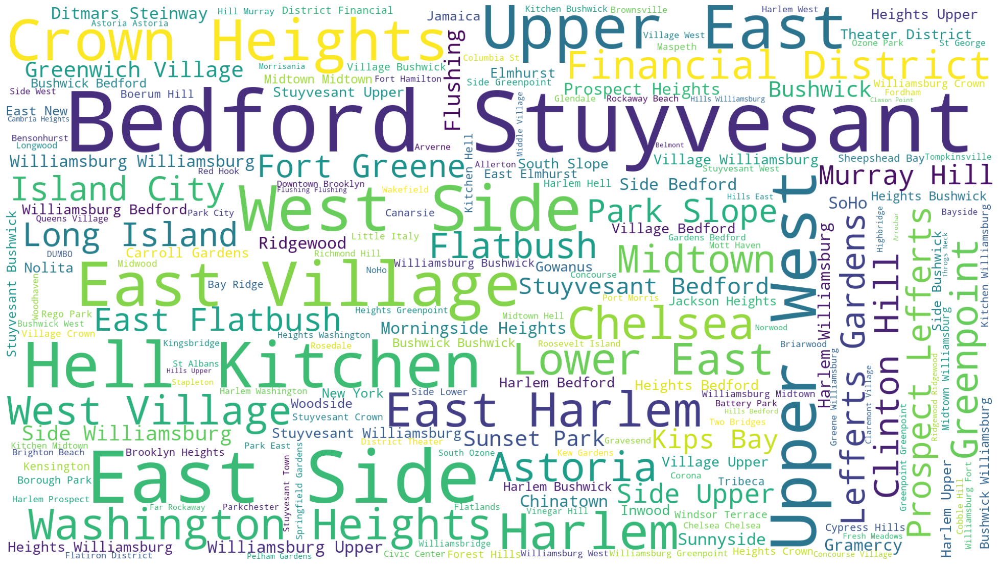

In [24]:
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='white',
                          width=1920,
                          height=1080
                         ).generate(" ".join(df.neighbourhood))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('neighbourhood.png')
plt.show()

* neighbourhood columns mean specific area at which hotels are. 
* we have total 221 unique areas having airbnb hotels
* Let's check the top 20 neighbourhood (area)

In [25]:
df['neighbourhood'].value_counts().head(20)

Williamsburg          3918
Bedford-Stuyvesant    3713
Harlem                2657
Bushwick              2463
Upper West Side       1970
Hell's Kitchen        1957
East Village          1852
Upper East Side       1798
Crown Heights         1564
Midtown               1545
East Harlem           1117
Greenpoint            1115
Chelsea               1113
Lower East Side        911
Astoria                900
Washington Heights     898
West Village           768
Financial District     744
Flatbush               621
Clinton Hill           572
Name: neighbourhood, dtype: int64

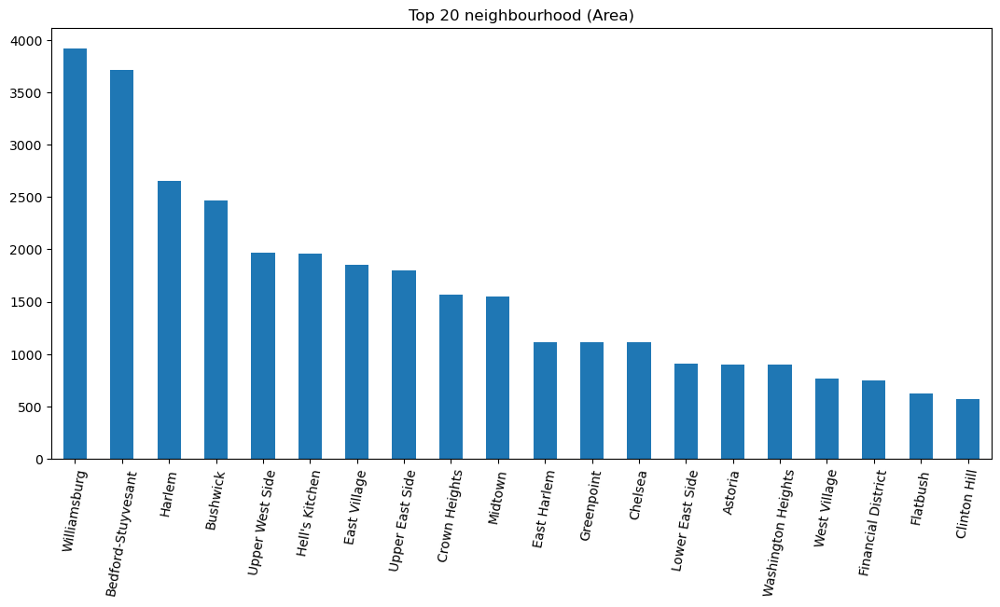

In [26]:
df['neighbourhood'].value_counts().head(20).plot(kind = 'bar', figsize = (13, 6))
plt.title('Top 20 neighbourhood (Area)')
plt.xticks(rotation=80)
plt.show()

* The above bar graph is showing top 20 areas where most hotels are. 
* On x axis there are area's name and on y-axis there are number of hotels in that area. 
* The bar is in sorted order based on the number of hotels
* We can see that Williamsburg and Bedford-Stuyvesant are the top ares having more hotels. 

In [27]:
# check the unique room type 
df['room_type'].unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

There are three room types:
* Private Room
* Entire home
* Shared room

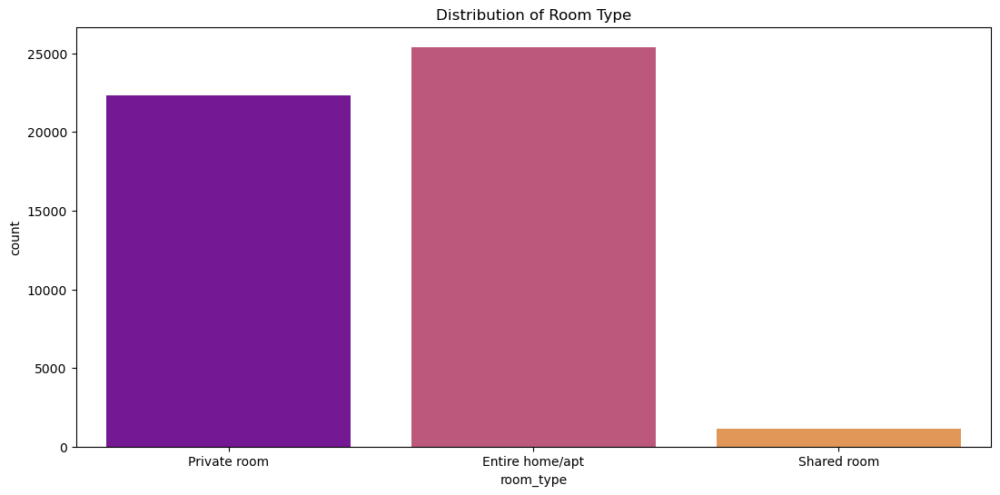

In [28]:
# check the distribution of room type 
sns.countplot(df['room_type'], palette="plasma")
fig = plt.gcf()
fig.set_size_inches(13,6)
plt.title('Distribution of Room Type')
plt.show()

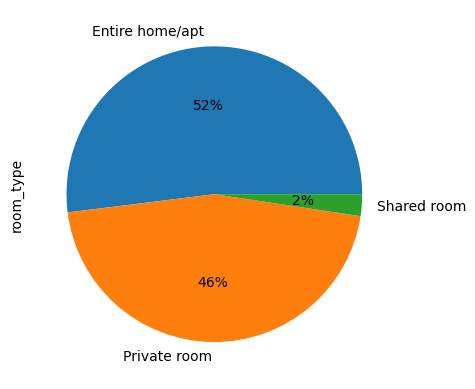

In [29]:
df['room_type'].value_counts().plot(kind = "pie", autopct = "%.f%%")
plt.show()

* Majority of the hotels are offering Entire home for families
* On second they are offering Private room 
* On third shared room, people usually don't prefer shared room. 

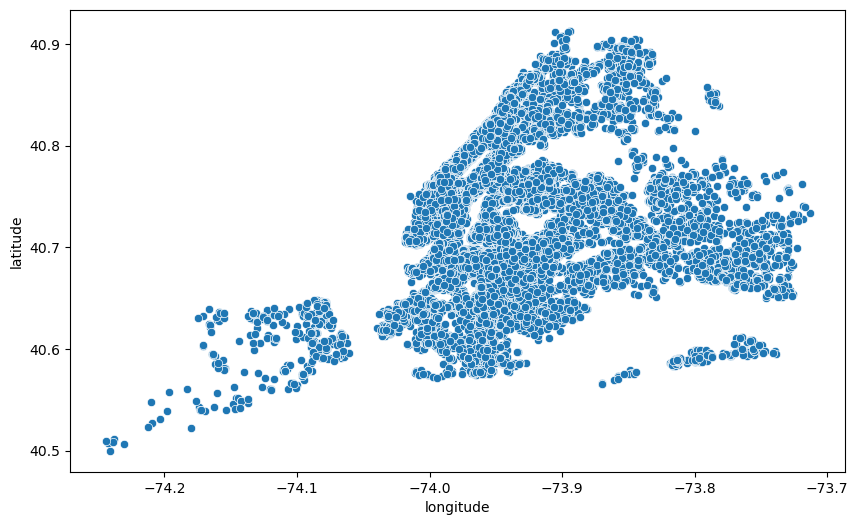

In [30]:
#map of NY
plt.figure(figsize=(10,6))
sns.scatterplot(df.longitude,df.latitude,)
plt.show()

#### Numerical Data

##### First. What is the global price distribution?


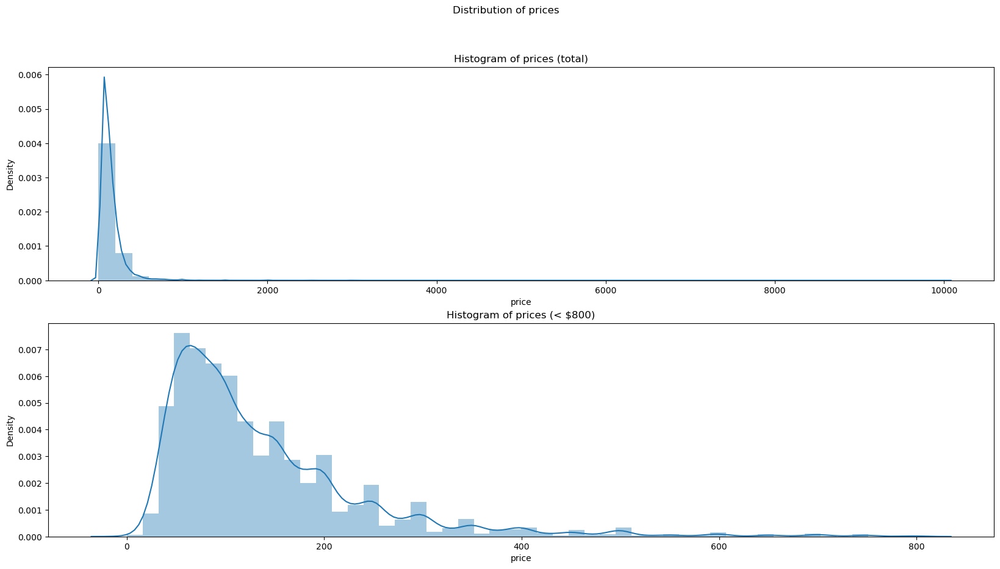

In [31]:
fig, ax= plt.subplots(2,1, figsize=(20,10))

ax[0].set_title("Histogram of prices (total)")
sns.distplot(df['price'], kde=True, ax=ax[0])
ax[1].set_title("Histogram of prices (< $800)")
sns.distplot(df[df['price'] < 800]['price'], kde=True, ax=ax[1])



fig.suptitle("Distribution of prices")
fig.show()

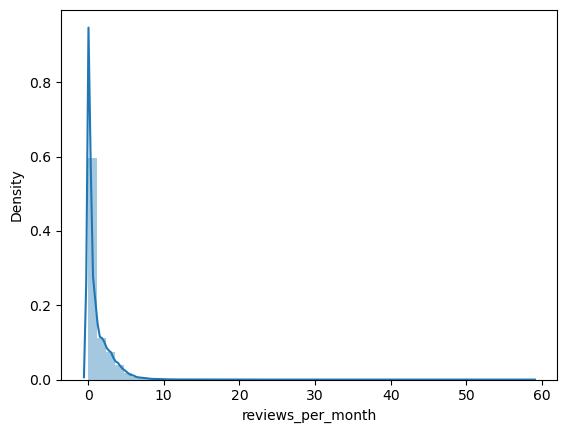

In [32]:
# distribution of reviews_per_month
sns.distplot(df['reviews_per_month'], kde=True)
plt.show()

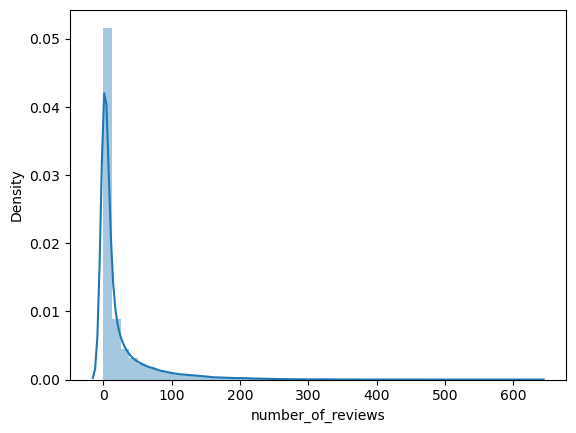

In [33]:
# distribution of number_of_reviews
sns.distplot(df['number_of_reviews'], kde=True)
plt.show()

### Bivariate Analysis

#### Host id vs Listing

In [34]:
#let's see what hosts (IDs) have the most listings on Airbnb platform and taking advantage of this service
top_host=df.host_id.value_counts().head(10)
top_host

219517861    327
107434423    232
30283594     121
137358866    103
16098958      96
12243051      96
61391963      91
22541573      87
200380610     65
1475015       52
Name: host_id, dtype: int64

In [35]:
#coming back to our dataset we can confirm our fidnings with already existing column called 
#'calculated_host_listings_count'
top_host_check=df.calculated_host_listings_count.max()
top_host_check

327

In [36]:
top_host_df=pd.DataFrame(top_host)
top_host_df.reset_index(inplace=True)
top_host_df.rename(columns={'index':'Host_ID', 'host_id':'P_Count'}, inplace=True)
top_host_df

,Host_ID,P_Count
0,219517861,327
1,107434423,232
2,30283594,121
3,137358866,103
4,16098958,96
5,12243051,96
6,61391963,91
7,22541573,87
8,200380610,65
9,1475015,52


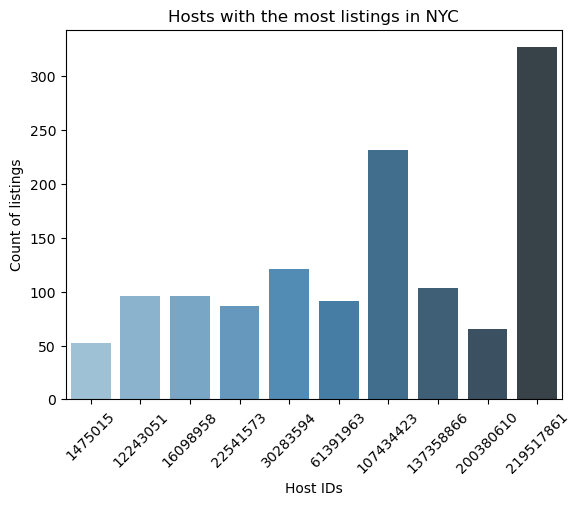

In [37]:
viz_1=sns.barplot(x="Host_ID", y="P_Count", data=top_host_df,
                 palette='Blues_d')
viz_1.set_title('Hosts with the most listings in NYC')
viz_1.set_ylabel('Count of listings')
viz_1.set_xlabel('Host IDs')
viz_1.set_xticklabels(viz_1.get_xticklabels(), rotation=45)
plt.show()

Interesting, we can see that there is a good distribution between top 10 hosts with the most listings. First host has more than 300+ listings.

#### neighbourhood_group vs price 

In [38]:
#let's find out more about our neiberhoods presented 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island', and 'Bronx'

#Brooklyn
sub_1=df.loc[df['neighbourhood_group'] == 'Brooklyn']
price_sub1=sub_1[['price']]
#Manhattan
sub_2=df.loc[df['neighbourhood_group'] == 'Manhattan']
price_sub2=sub_2[['price']]
#Queens
sub_3=df.loc[df['neighbourhood_group'] == 'Queens']
price_sub3=sub_3[['price']]
#Staten Island
sub_4=df.loc[df['neighbourhood_group'] == 'Staten Island']
price_sub4=sub_4[['price']]
#Bronx
sub_5=df.loc[df['neighbourhood_group'] == 'Bronx']
price_sub5=sub_5[['price']]
#putting all the prices' dfs in the list
price_list_by_n=[price_sub1, price_sub2, price_sub3, price_sub4, price_sub5]

In [39]:
#creating an empty list that we will append later with price distributions for each neighbourhood_group
p_l_b_n_2=[]
#creating list with known values in neighbourhood_group column
nei_list=['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx']
#creating a for loop to get statistics for price ranges and append it to our empty list
for x in price_list_by_n:
    i=x.describe(percentiles=[.25, .50, .75])
    i=i.iloc[3:]
    i.reset_index(inplace=True)
    i.rename(columns={'index':'Stats'}, inplace=True)
    p_l_b_n_2.append(i)
#changing names of the price column to the area name for easier reading of the table    
p_l_b_n_2[0].rename(columns={'price':nei_list[0]}, inplace=True)
p_l_b_n_2[1].rename(columns={'price':nei_list[1]}, inplace=True)
p_l_b_n_2[2].rename(columns={'price':nei_list[2]}, inplace=True)
p_l_b_n_2[3].rename(columns={'price':nei_list[3]}, inplace=True)
p_l_b_n_2[4].rename(columns={'price':nei_list[4]}, inplace=True)
#finilizing our dataframe for final view    
stat_df=p_l_b_n_2
stat_df=[df.set_index('Stats') for df in stat_df]
stat_df=stat_df[0].join(stat_df[1:])
stat_df

,Brooklyn,Manhattan,Queens,Staten Island,Bronx
Stats,,,,,
min,0.0,0.0,10.0,13.0,0.0
25%,60.0,95.0,50.0,50.0,45.0
50%,90.0,150.0,75.0,75.0,65.0
75%,150.0,220.0,110.0,110.0,99.0
max,10000.0,10000.0,10000.0,5000.0,2500.0


we can see from our statistical table that we have some extreme values, therefore we need to remove them for the sake of a better visualization


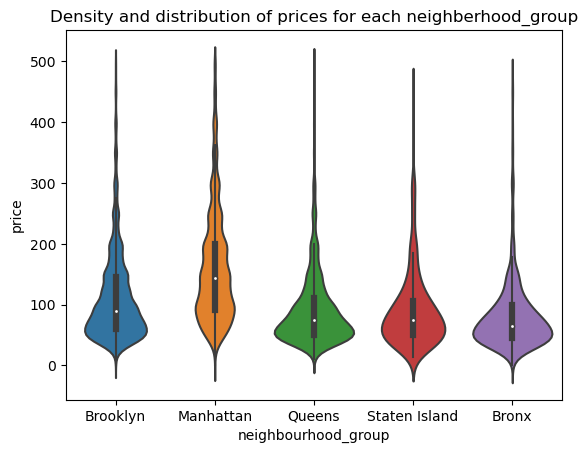

In [40]:
#creating a sub-dataframe with no extreme values / less than 500
sub_6=df[df.price < 500]
#using violinplot to showcase density and distribtuion of prices 
viz_2=sns.violinplot(data=sub_6, x='neighbourhood_group', y='price')
viz_2.set_title('Density and distribution of prices for each neighberhood_group')
plt.show()

### Customer can understand Price Distribution And Demand in each Area to make a decision.

Great, with a statistical table and a violin plot we can definitely observe a couple of things about distribution of prices for Airbnb in NYC boroughs. 
* First, we can state that Manhattan has the highest range of prices for the listings with \\$150 price as average observation, followed by Brooklyn with \$90 per night. Queens and Staten Island appear to have very similar distributions, Bronx is the cheapest of them all. 
* This distribution and density of prices were completely expected; for example, as it is no secret that Manhattan is one of the most expensive places in the world to live in, where Bronx on other hand appears to have lower standards of living.

In [48]:
review_by_area = df.groupby(['neighbourhood_group'])['number_of_reviews'].sum().reset_index()
fig = px.pie(review_by_area, values='number_of_reviews', names='neighbourhood_group')
fig.show()

* if we compare Manhattan & Brooklyn
    * Manhattan has the highest price range 150 dollars but Reviews are lesser then Brooklyn
    * Brooklyn has 90 price range But have more Reviews than Manhattan
    
* If we compare Queen and Staten Island Both have same price but Queen has more review as compared to State Island. It means more customers visited Queen as compare to Staten Island Area

#### Demand is impactig the price for a fact

In [52]:

fig = px.scatter_mapbox(df[df['price'] > 700], lat="latitude", lon="longitude",  color="price", size="reviews_per_month",
                  color_continuous_scale=px.colors.sequential.Agsunset, height=760,size_max=20,mapbox_style="carto-positron", zoom=10, title='Scatter map of most expensive Airbnb rents (>$700)')
fig.show("notebook")

In [42]:
fig = px.scatter_mapbox(df[df['price'] <= 700], lat="latitude", lon="longitude",  color="room_type", size="price",
                  color_continuous_scale=px.colors.sequential.Agsunset, height=760,size_max=20,mapbox_style="carto-positron", zoom=10, title='Type of room distribution on the map.')
fig.show()

#### Price vs Neighboured

Let's take a look at the spatial distribution of prices (Which are the most expensive zones?).



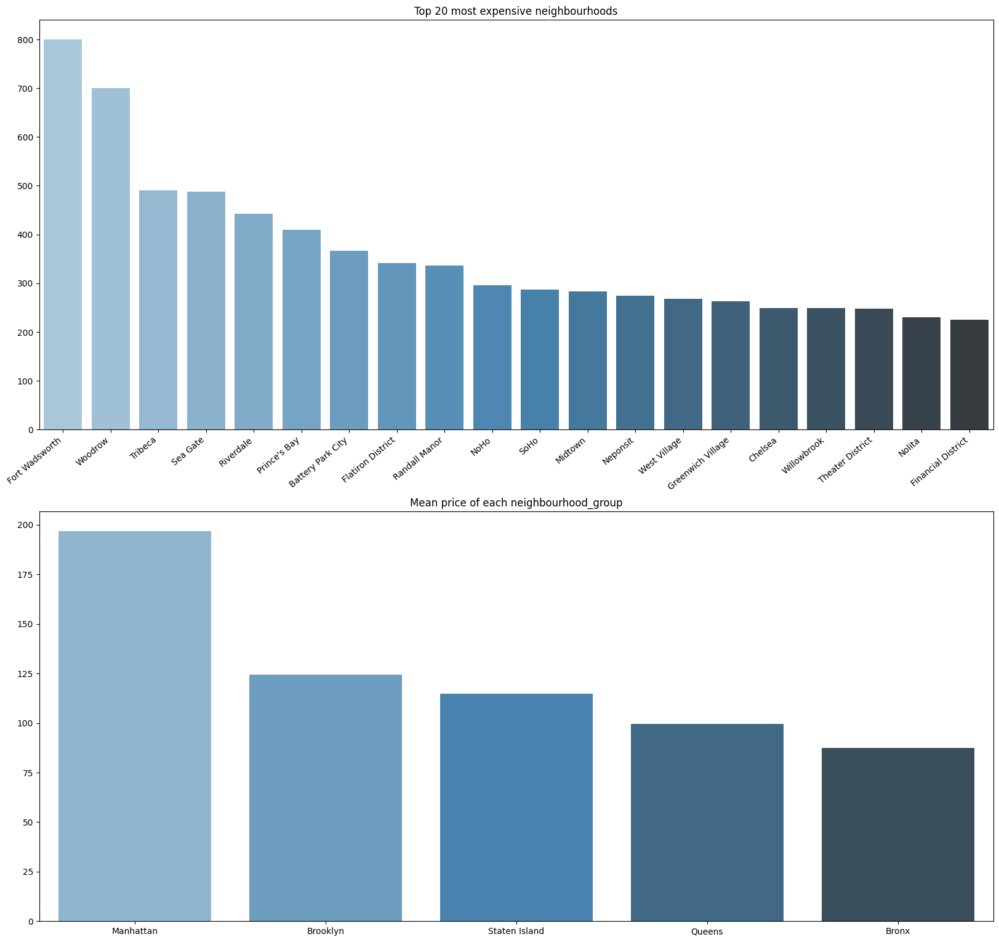

In [42]:
d = df.groupby('neighbourhood')['price'].mean().sort_values(ascending=False)

fig, ax= plt.subplots(2,1, figsize=(20,19))
sns.barplot(d.index.tolist()[:20], d.values[:20], ax=ax[0], palette=("Blues_d"))
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=40, ha="right")
ax[0].set_title('Top 20 most expensive neighbourhoods')

d = df.groupby('neighbourhood_group')['price'].mean().sort_values(ascending=False)[:5]
sns.barplot(d.index.tolist(), d.values, ax=ax[1], palette=("Blues_d"))
#ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=40, ha="right")
ax[1].set_title('Mean price of each neighbourhood_group')

fig.show()

#### price vs Room type

* From the previous plots we can see that the most expensive rooms tend to be located in the Manhattan zone.
* We also can study the prices depending the room type.

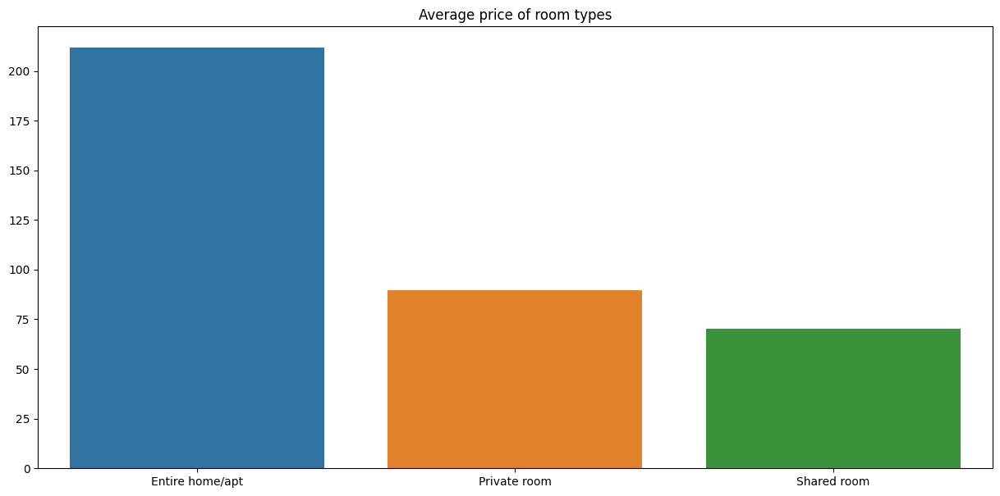

In [43]:
d = df.groupby('room_type')['price'].mean().sort_values(ascending=False)
fig, ax= plt.subplots(figsize=(15,7))
sns.barplot(d.index.tolist(), d.values, ax=ax)
ax.set_title('Average price of room types')
fig.show()

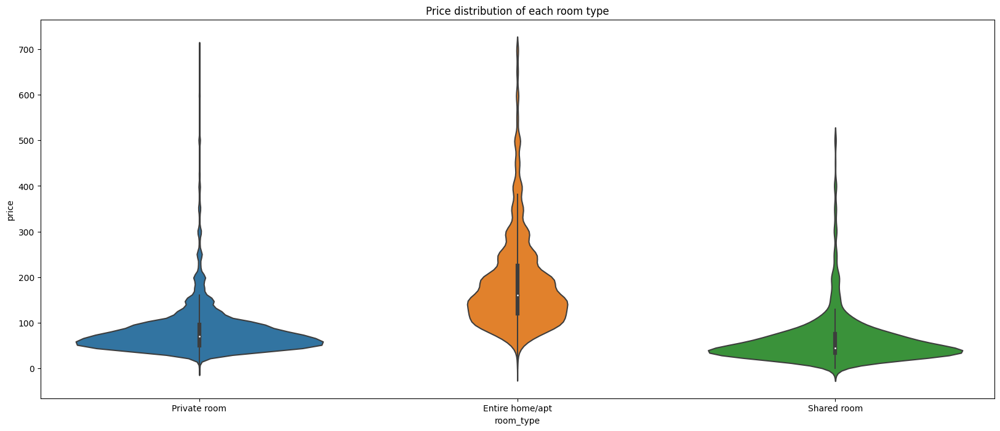

In [44]:
fig, ax= plt.subplots(figsize=(20,8))
sns.violinplot(x="room_type", y="price", data=df[df['price'] <= 700], ax=ax)
ax.set_title('Price distribution of each room type')
fig.show()

* We can see that Entire apartments are more expensive as compared to private rooms and it's making sense. And the average price is \\$150.
* The private room's average cost is 70 to \\$90.
* And Shared room's average cost is 40 to 60 $.

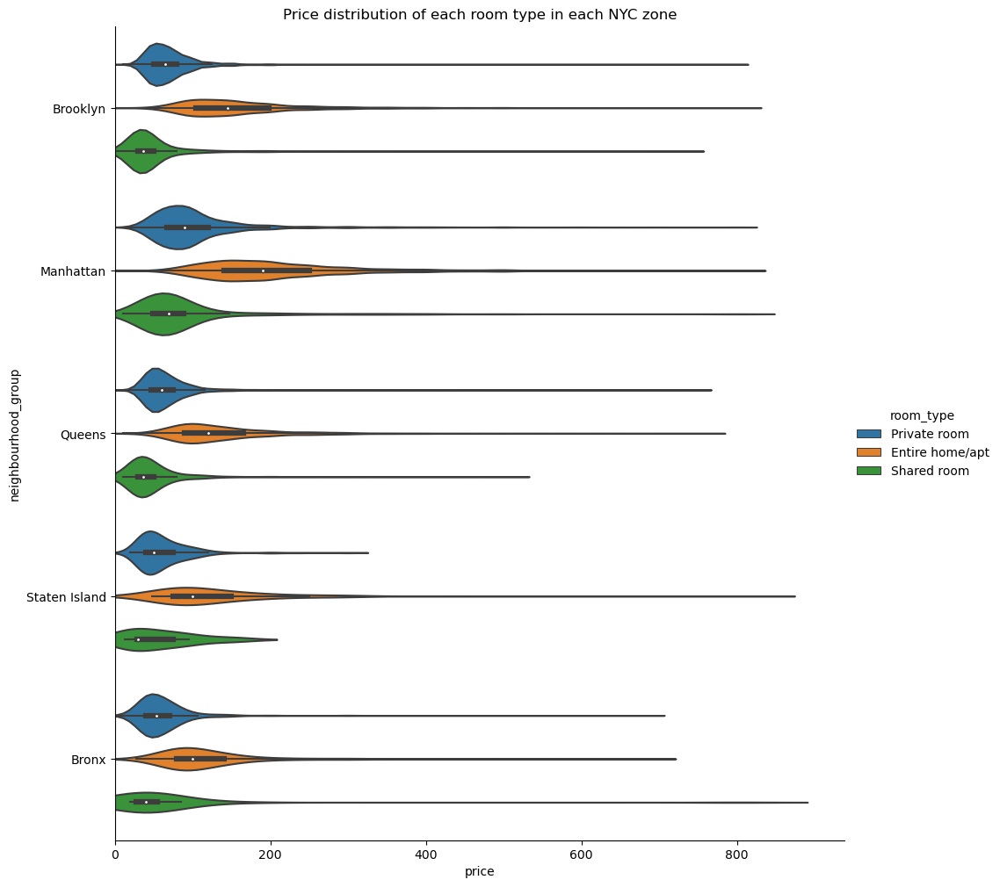

In [51]:
f = sns.catplot(x="price", y="neighbourhood_group", hue="room_type", data=df[df['price'] <= 800], kind='violin', height=10)
f.axes[0][0].set_xlim(0,)
plt.title('Price distribution of each room type in each NYC zone')
plt.show()

### Customer can Understand Relation Between Room Type Provided compared to Price in Each Area in this conclusion

* The price distributions of each room type in the 5 different NY zones look similar, the most notable difference is on their means.
    * Manhattan is the most Expensive Area and second is Brooklyn Although Brooklyn has more demand as compared to Manhattan based on number of reviews. 
    * But here Again, On Average Manhattan is charging more for each Room Type as compared to Brooklyn
    * Queen has much more demand based on review as compared to State Island which has low demand. It means most of the time customers visited Queen as compare to Staten Island Area. May be that's the reason the average prices of queen is slighter higher then Staten Island.
    * Bronx is cheapest and have more demand as compared to Staten Island

* The price distributions of the room types point that, in general, shared and private rooms have similar prices (less deviation). On the other hand, entire apartaments have more variability (and are more expensive, obviously).

* We don't have data about the properties, but we can gess that other variables like square ft. or being near a metro station affect the price.



#### if customer want a cheaper house but demanded house/ where they have more number of stays then bronx is a good to go as compared to Staten Island
#### More Reviews can point to more ratings as well So if a Customer wants ratings but not at the highest price So Brooklyn will be a good option. 

#### prices vs number of nights

In [46]:
# how the prices vary with the number of nights?
df['minimum_nights'].describe()


count    48879.000000
mean         7.011027
std         20.016000
min          1.000000
25%          1.000000
50%          3.000000
75%          5.000000
max       1250.000000
Name: minimum_nights, dtype: float64

In [47]:
print(f'Percentile 95 of minimum_nights: {np.percentile(df["minimum_nights"], 95)}')
print(f'Mean of minimum_nights: {np.mean(df["minimum_nights"])}')
print(f"Mode of minimum_nights: {df[(df['minimum_nights'] <= 30) & (df['minimum_nights'] > 0)]['minimum_nights'].mode()[0]}")


Percentile 95 of minimum_nights: 30.0
Mean of minimum_nights: 7.011027230507989
Mode of minimum_nights: 1


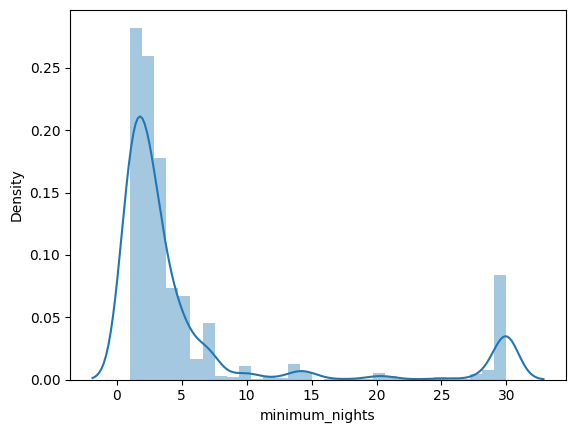

In [48]:
sns.distplot(df[(df['minimum_nights'] <= 30) & (df['minimum_nights'] > 0)]['minimum_nights'], bins=31)
plt.show()

We can see that are a high number of rooms with minimum_nights=0 and some of them excesivelly high (1200). As explained by Dgomonov, this can be due to, at the time the data was gathered, the rooms were not available, or bad data. However, analyzing the distribution, we see that the normal value is arround 2 and the highest ones tend to be arround 30 nights.

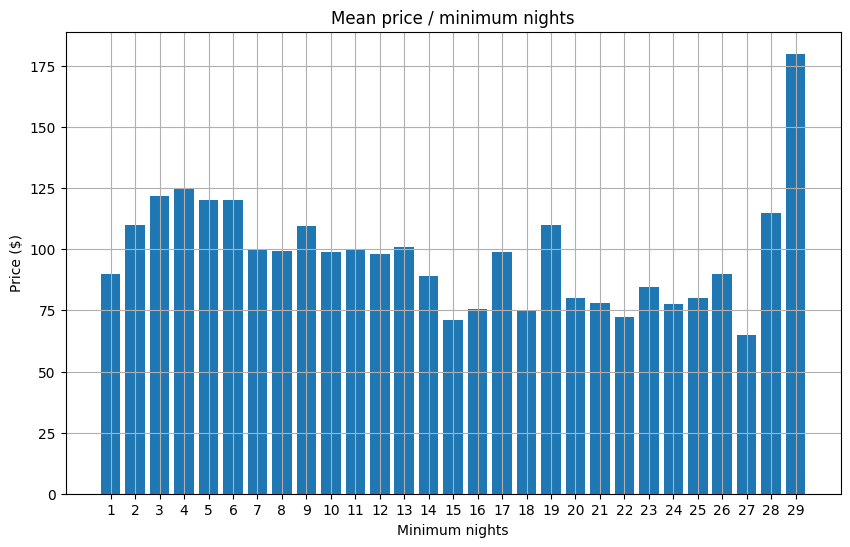

In [49]:
d = df[df['minimum_nights'] < 30].groupby('minimum_nights')['price'].median()

fig = plt.figure(figsize=(10,6))
plt.xticks(np.arange(min(d.keys().tolist()), max(d.keys().tolist())+1, 1.0))
plt.bar(d.keys().tolist(), d.tolist())
plt.title('Mean price / minimum nights')
plt.xlabel('Minimum nights')
plt.ylabel('Price ($)')
plt.grid(True)

#### Section conclusions
We can see several things:

* Entire apartments are the most expensive ones (obviously)
* Shared rooms tend to be more in the city centre.
* The price distributions of each room type in the 5 different NY zones look similar, the most notable difference is on their means.
* The price distributions of the room types point that, in general, shared and private rooms have similar prices (less deviation). On the other hand, entire apartaments have more variability (and are more expensive, obviously). We don't have data about the properties, but we can gess that other variables like square ft. or being near a metro station affect the price.
* When looking at the Popularity/Price plot, we can see that rooms with more reviews tend to be cheaper (although the Entire appartment class is more noisy than the others). This can be explained as: the more expensive is an apartment, the less people stays there and therefore, the less reviews. This would be interesting to use in a model to predict prices or the popularity of a room.
* It's generally cheaper to stay in rooms between 14 and 28 nights.
* Usually, the minimum required nights to stay in a room is arround 2.

### Multivariate Analysis

#### neighbourhood vs Room type vs neighboured-group

In [50]:
#as we saw earlier from unique values for neighbourhood there are way too many to concentrate on;
#therefore, let's grab just top 10 neighbourhoods that have the most listings in them

#finding out top 10 neighbourhoods
df.neighbourhood.value_counts().head(10)

Williamsburg          3918
Bedford-Stuyvesant    3713
Harlem                2657
Bushwick              2463
Upper West Side       1970
Hell's Kitchen        1957
East Village          1852
Upper East Side       1798
Crown Heights         1564
Midtown               1545
Name: neighbourhood, dtype: int64

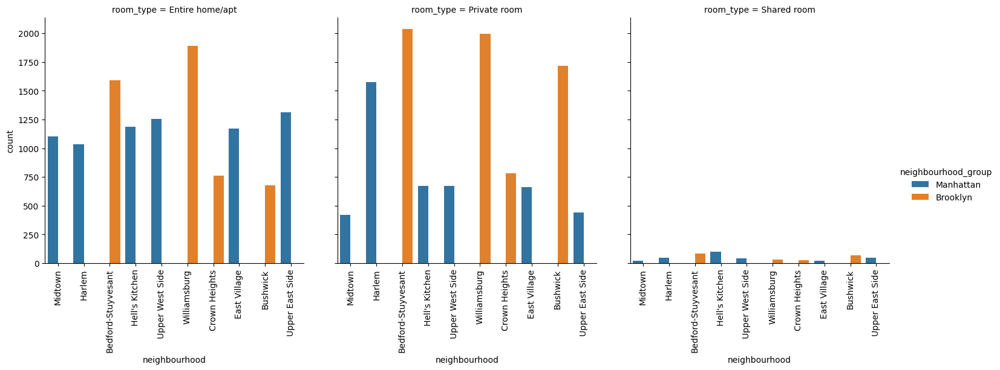

In [51]:
#let's now combine this with our boroughs and room type for a rich visualization we can make

#grabbing top 10 neighbourhoods for sub-dataframe
sub_7=df.loc[df['neighbourhood'].isin(['Williamsburg','Bedford-Stuyvesant','Harlem','Bushwick',
                 'Upper West Side','Hell\'s Kitchen','East Village','Upper East Side','Crown Heights','Midtown'])]
#using catplot to represent multiple interesting attributes together and a count
viz_3=sns.catplot(x='neighbourhood', hue='neighbourhood_group', col='room_type', data=sub_7, kind='count')
viz_3.set_xticklabels(rotation=90)
plt.show()

Amazing, but let' breakdown on what we can see from this plot. 
* First, we can see that our plot consists of 3 subplots - that is the power of using catplot; with such output, we can easily proceed with comparing distributions among interesting attributes. Y and X axes stay exactly the same for each subplot, Y-axis represents a count of observations and X-axis observations we want to count. However, there are 2 more important elements: column and hue; those 2 differentiate subplots. After we specify the column and determined hue we are able to observe and compare our Y and X axes among specified column as well as color-coded. So, what do we learn from this? 
* The observation that is definitely contrasted the most is that 'Shared room' type Airbnb listing is barely available among 10 most listing-populated neighborhoods. Then, we can see that for these 10 neighborhoods only 2 boroughs are represented: Manhattan and Brooklyn; that was somewhat expected as Manhattan and Brooklyn are one of the most traveled destinations, therefore would have the most listing availability. 
* We can also observe that Bedford-Stuyvesant and Williamsburg are the most popular for Brooklyn borough, and Harlem for Manhattan.


#### Best locations of each area with more ratings?
Bedford-Stuyvesant and Williamsburg are the most popular for Brooklyn borough, and Harlem for Manhattan.


#### map (latitude longitude) vs availability 365 and price

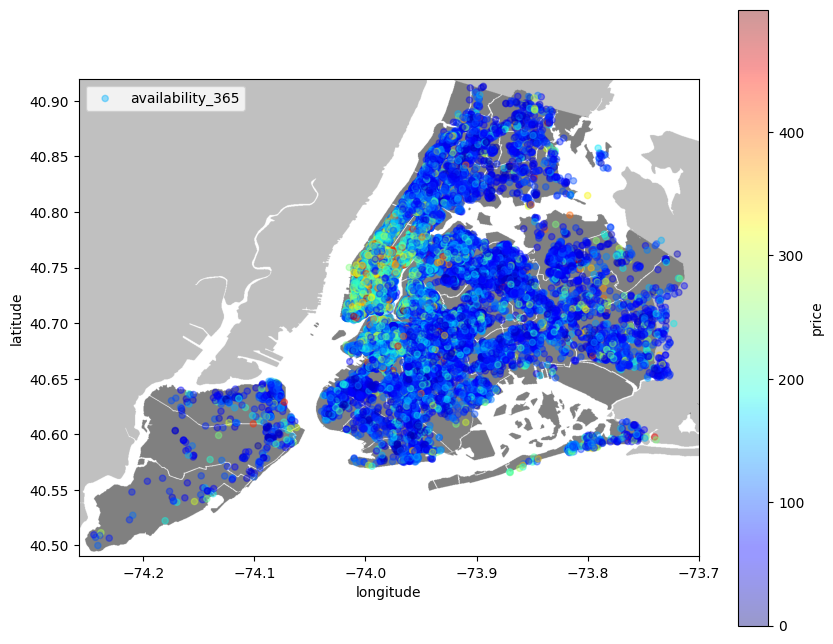

In [52]:
import PIL
import urllib
#initializing the figure size
plt.figure(figsize=(10,8))
#loading the png NYC image found on Google and saving to my local folder along with the project

from PIL import Image
import urllib.request

img_path = 'https://upload.wikimedia.org/wikipedia/commons/e/ec/Neighbourhoods_New_York_City_Map.PNG'
img_data = urllib.request.urlopen(img_path)
img = np.array(Image.open(img_data))

#scaling the image based on the latitude and longitude max and mins for proper output
plt.imshow(img,zorder=0,extent=[-74.258, -73.7, 40.49,40.92])
ax=plt.gca()
#using scatterplot again
sub_6.plot(kind='scatter', x='longitude', y='latitude', label='availability_365', c='price', ax=ax, 
           cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4, zorder=5)

plt.legend()
plt.show()

Fantastic! After scaling our image the best we can, we observe that we end up with a very immersive heatmap. Using latitude and longitude points were able to visualize all NYC listings. Also, we added a color-coded range for each point on the map based on the price of the listing. However, it is important to note that we had to drop some extremely high values as they are treated as outliers for our analysis.

#### Hotels/Room Name Description

In [53]:
#let's comeback now to the 'name' column as it will require litte bit more coding and continue to analyze it!

#initializing empty list where we are going to put our name strings
_names_=[]
#getting name strings from the column and appending it to the list
for name in df.name:
    _names_.append(name)
#setting a function that will split those name strings into separate words   
def split_name(name):
    spl=str(name).split()
    return spl
#initializing empty list where we are going to have words counted
_names_for_count_=[]
#getting name string from our list and using split function, later appending to list above
for x in _names_:
    for word in split_name(x):
        word=word.lower()
        _names_for_count_.append(word)

In [54]:
#we are going to use counter
from collections import Counter
#let's see top 25 used words by host to name their listing
_top_25_w=Counter(_names_for_count_).most_common()
_top_25_w=_top_25_w[0:25]

In [55]:
#now let's put our findings in dataframe for further visualizations
sub_w=pd.DataFrame(_top_25_w)
sub_w.rename(columns={0:'Words', 1:'Count'}, inplace=True)

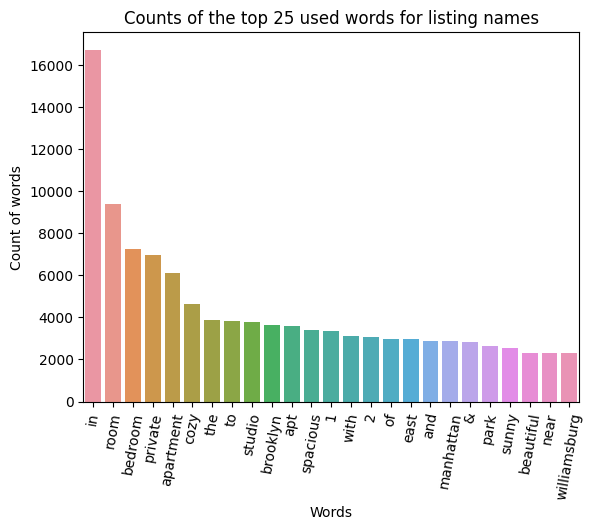

In [56]:
#we are going to use barplot for this visualization
viz_5=sns.barplot(x='Words', y='Count', data=sub_w)
viz_5.set_title('Counts of the top 25 used words for listing names')
viz_5.set_ylabel('Count of words')
viz_5.set_xlabel('Words')
viz_5.set_xticklabels(viz_5.get_xticklabels(), rotation=80)
plt.show()

### Tips For Host For Defining Listing (Name) for It's services. 
Most Searched words or terms for airbnb? <br>
What is the reason behind it?

We can observe that finding out and going over top 25 used listings' name words - we are able to see one clear trend. 
* It shows that hosts are simply describing their listing in a short form with very specific terms for easier search by a potential traveler. Such words are 'room', 'bedroom', 'private', 'apartment', 'studio'. 
* This shows that there are no catchphrases or 'popular/trending' terms that are used for names; hosts use very simple terms describing the space and the area where the listing is. 
* This technique was somewhat expected as dealing with multilingual customers can be tricky and you definitely want to describe your space in a concise and understood form as much as possible.

### Comparison Analysis
#### More on hotels name Description

In [57]:
#import nltk
#nltk.download('punkt')
#nltk.download('stopwords')

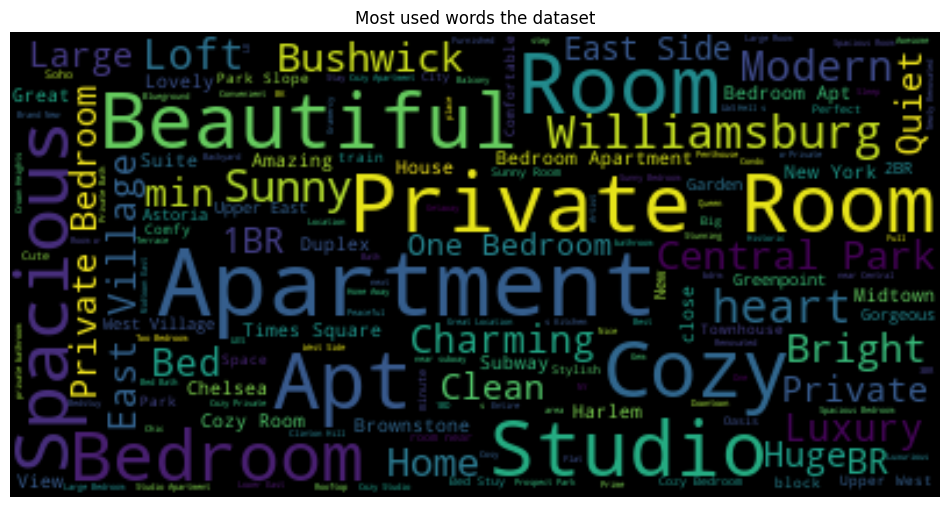

In [58]:
import functools
import nltk
from nltk.corpus import stopwords


# Words that won't add anything apart from what we already know from the other data.
UNWANTED_WORDS = set(['manhattan', 'queen', 'brooklyn', 'nyc'])
fig, ax = plt.subplots(figsize=(12,8))

text = functools.reduce(lambda a,b: a + " " + str(b), df.sample(frac=0.3)['name'])
text = ' '.join([w for w in nltk.word_tokenize(text) if w.lower() not in UNWANTED_WORDS])

wc = WordCloud(max_font_size=40).generate(text)
ax.imshow(wc, interpolation='bilinear')
ax.set_title("Most used words the dataset")
plt.axis("off")
fig.show()

In [59]:
def get_top_terms(documents, ngram_range=(1,1), unwanted_words=set(), min_occurrences=1):
    """ Get a list of the most common n-grams (sorted)
    Params
    ----------
        documents: List of documents to analyze
        ngram_range (tuple): Whether extracting up to n-grams
        unwanted_words (set): Set of custom blacklist of words
        min_occurrences (int): return only words with occurrences >= min_occurrences
    Returns
    ----------
        List of tuples with (word, n_times).
    """
    blacklist = set(stopwords.words('english')).union(unwanted_words)
    vec = CountVectorizer(stop_words = blacklist, ngram_range=ngram_range)
    sum_words = vec.fit_transform(documents).sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    
    if min_occurrences > 1:
        words_freq = list(filter(lambda x: x[1] >= min_occurrences, words_freq))
    return words_freq

Let's get top n-grams of several categories.


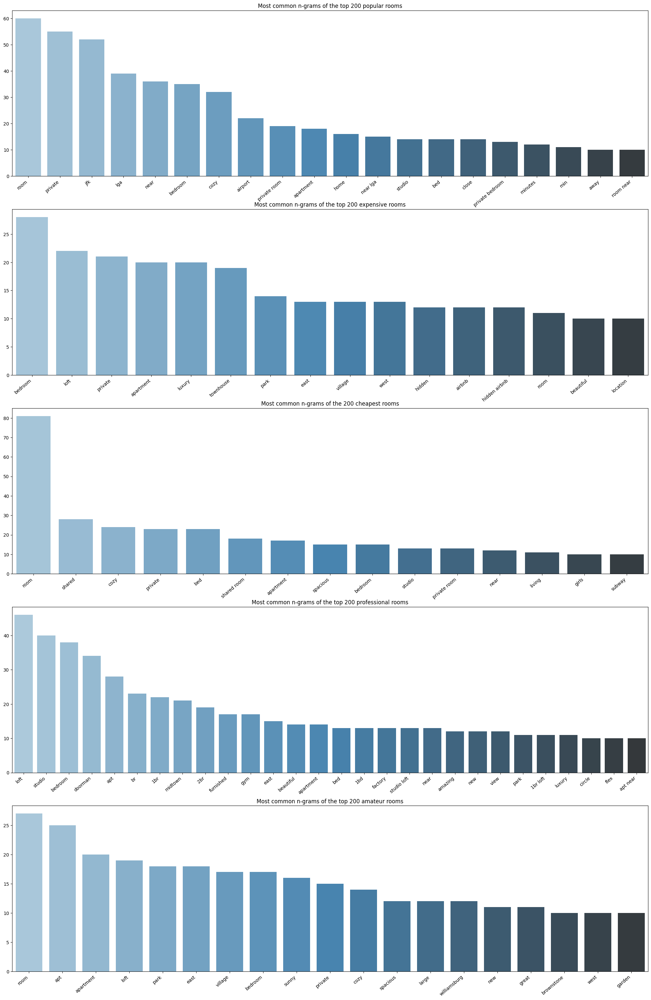

In [60]:
from sklearn.feature_extraction.text import CountVectorizer

top_ngrams = get_top_terms(df.sort_values('reviews_per_month', ascending=False)['name'].iloc[:200], ngram_range=(1,2), unwanted_words=UNWANTED_WORDS, min_occurrences=10)
fig, ax= plt.subplots(5,1,figsize=(25,38))
sns.barplot([x[0] for x in top_ngrams], [x[1] for x in top_ngrams], ax=ax[0],  palette=("Blues_d"))
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=40, ha="right")
ax[0].set_title('Most common n-grams of the top 200 popular rooms')


top_ngrams = get_top_terms(df.sort_values('price', ascending=False)['name'].iloc[:200], ngram_range=(1,2), unwanted_words=UNWANTED_WORDS, min_occurrences=10)
sns.barplot([x[0] for x in top_ngrams], [x[1] for x in top_ngrams], ax=ax[1],  palette=("Blues_d"))
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=40, ha="right")
ax[1].set_title('Most common n-grams of the top 200 expensive rooms')


top_ngrams = get_top_terms(df.sort_values('price', ascending=True)['name'].iloc[:200], ngram_range=(1,2), unwanted_words=UNWANTED_WORDS, min_occurrences=10)
sns.barplot([x[0] for x in top_ngrams], [x[1] for x in top_ngrams], ax=ax[2],  palette=("Blues_d"))
ax[2].set_xticklabels(ax[2].get_xticklabels(), rotation=40, ha="right")
ax[2].set_title('Most common n-grams of the 200 cheapest rooms')


top_ngrams = get_top_terms(df[df['calculated_host_listings_count']>50]['name'].iloc[:200], ngram_range=(1,2), unwanted_words=UNWANTED_WORDS, min_occurrences=10)
sns.barplot([x[0] for x in top_ngrams], [x[1] for x in top_ngrams], ax=ax[3],  palette=("Blues_d"))
ax[3].set_xticklabels(ax[3].get_xticklabels(), rotation=40, ha="right")
ax[3].set_title('Most common n-grams of the top 200 professional rooms')


top_ngrams = get_top_terms(df[df['calculated_host_listings_count']<4]['name'].iloc[:200], ngram_range=(1,2), unwanted_words=UNWANTED_WORDS, min_occurrences=10)
sns.barplot([x[0] for x in top_ngrams], [x[1] for x in top_ngrams], ax=ax[4],  palette=("Blues_d"))
ax[4].set_xticklabels(ax[4].get_xticklabels(), rotation=40, ha="right")
ax[4].set_title('Most common n-grams of the top 200 amateur rooms')


fig.show()

### Tips For Host For defining Room Type based on Customer Search

We can see differences when analyzing the word distribution of the rooms:

* The words of the most expensive rooms reinforce our previous hypotesis (the zone in which the room is located affect the price) as the most used words include central/central park/townhouse.
* The most popular rooms are the ones which are near to airports or 'minutes from' places. This would way that if we had an accessible room (near transportation), its chances to be popular would be increased.
* The amateur rooms tend to be sold in other ways in comparison to the professional ones. They tend to be posted with concepts as "cozy", "spatious", "great" (comfort) whereas the professional ones are sold in a more objective way (not using valorations).
* The cheapest rooms also sell subjective terms. We can also suppose a certain overlap between amateur and cheap ones (from the distributions avobe, the amateur ones tend to be cheaper).

### Correlation

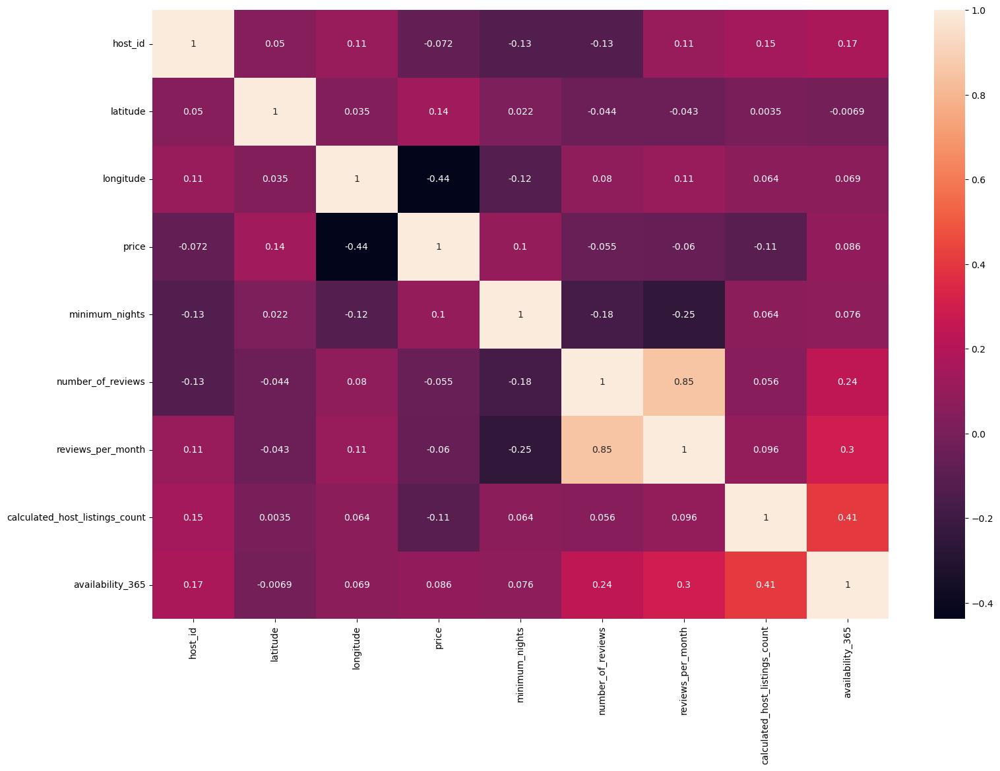

In [62]:
#Get Correlation between different variables
corr = df.corr(method='spearman')
plt.figure(figsize=(18,12))
sns.heatmap(corr, annot=True)
df.columns
plt.show()

### What are the features impacting price?


In [54]:
import scipy.stats as stats

In [58]:
# calculate ANOVA for each categorical feature
for col in df.select_dtypes(include="object"):
    groups = df.groupby(col)["price"].apply(list)
    F, p = stats.f_oneway(*groups)
    print(f"{col}: F={F:.2f}, p-value={p:.4f}")

# calculate chi-squared test for each categorical feature
for col in df.select_dtypes(include="object"):
    crosstab = pd.crosstab(df[col], df["price"])
    chi2, p, dof, expected = stats.chi2_contingency(crosstab)
    print(f"{col}: chi2={chi2:.2f}, p-value={p:.4f}")

name: F=8.96, p-value=0.0000
neighbourhood_group: F=354.75, p-value=0.0000
neighbourhood: F=15.95, p-value=0.0000
room_type: F=1715.30, p-value=0.0000
name: chi2=32497370.73, p-value=0.0000
neighbourhood_group: chi2=9683.66, p-value=0.0000
neighbourhood: chi2=164301.66, p-value=0.0000
room_type: chi2=29319.86, p-value=0.0000


* P value 0.000 means the null hypothesis is true and is therefore very statistically significant.
* A low p-value (usually less than 0.05) indicates that there is a significant relationship between the categorical variable and the target variable "price".

* <b>Area, Host, and room Type</b> have strong correlation with price, And we have already observed it in our previous analysis. 

#### So the features which are impacting the price are Area, Host, Room Type. 

#### number_of_reviews vs listing vs price

In [62]:
# last column we need to look at is 'number_of_reviews'

#let's grab 10 most reviewed listings in NYC
top_reviewed_listings=df.nlargest(10,'number_of_reviews')
top_reviewed_listings

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
11759,Room near JFK Queen Bed,47621202,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,14.58,2,333
2031,Great Bedroom in Manhattan,4734398,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,7.75,3,293
2030,Beautiful Bedroom in Manhattan,4734398,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,7.72,3,342
2015,Private Bedroom in Manhattan,4734398,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,7.57,3,339
13495,Room Near JFK Twin Beds,47621202,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,13.40,2,173
10623,Steps away from Laguardia airport,37312959,Queens,East Elmhurst,40.77006,-73.87683,Private room,46,1,543,11.59,5,163
1879,Manhattan Lux Loft.Like.Love.Lots.Look !,2369681,Manhattan,Lower East Side,40.71921,-73.99116,Private room,99,2,540,6.95,1,179
20403,Cozy Room Family Home LGA Airport NO CLEANING FEE,26432133,Queens,East Elmhurst,40.76335,-73.87007,Private room,48,1,510,16.22,5,341
4870,Private brownstone studio Brooklyn,12949460,Brooklyn,Park Slope,40.67926,-73.97711,Entire home/apt,160,1,488,8.14,1,269
471,LG Private Room/Family Friendly,792159,Brooklyn,Bushwick,40.70283,-73.92131,Private room,60,3,480,6.70,1,0


In [63]:
price_avrg=top_reviewed_listings.price.mean()
print('Average price per night: {}'.format(price_avrg))

Average price per night: 65.4


There is no reason to visualize this as table format would be the most suitable output for better reading. 
* From this table output, we can observe that top 10 most reviewed listings on Airbnb for NYC has price average of $65 with most of the listings under \$50, and 9/10 of them are 'Private room' type;
* top reviewed listing has 629 reviews.

### Summmary

This Airbnb ('AB_NYC_2019') dataset for the 2019 year appeared to be a very rich dataset with a variety of columns that allowed us to do deep data exploration on each significant column presented. We have tested several hypotesis against the data, and the conclussions obtained are listed at the end of each section, however, here are the most interesting ones (IMO).
* First, we have found hosts that take good advantage of the Airbnb platform and provide the most listings; we found that our top host has 327 listings. 
* After that, we proceeded with analyzing boroughs and neighborhood listing densities and what areas were more popular than another. Next, we put good use of our latitude and longitude columns and used to create a geographical heatmap color-coded by the price of listings. 
* Further, we came back to the first column with name strings and had to do a bit more coding to parse each title and analyze existing trends on how listings are named as well as what was the count for the most used words by hosts. Lastly, we found the most reviewed listings and analyzed some additional attributes. 
* For our data exploration purposes, it also would be nice to have couple additional features, such as positive and negative numeric (0-5 stars) reviews or 0-5 star average review for each listing; addition of these features would help to determine the best-reviewed hosts for NYC along with 'number_of_review' column that is provided. 
* Overall, we discovered a very good number of interesting relationships between features and explained each step of the process. 

* NYC shared rooms tend to be grouped in the city centre, maybe becuse there are thought for travelers who want to visit the most iconic city places.
* Relating the price/popularity variables suggest that people who travel and use Airbnb tend to prefer the posts which are cheaper
* There are two types of user posting rooms: Professionals, which are outliers, each one holding a high number of rooms; and Amateurs, who usually have only a few. Although amateurs can be making money as a business to, their volume is clearly inferior to the professional ones.
* The professional posts are located in the city centre.
* The way rooms are announced is different between professionals and amateurs. The first use more objective terms to describe the room whereas the second use more subjective.
* Having a room "near to" things affect to popularity (maybe it's a good idea to include this words in the title of the room).

This data analytics is very much mimicked on a higher level on Airbnb Data/Machine Learning team for better business decisions, control over the platform, marketing initiatives, implementation of new features and much more.

In [69]:
df.to_csv('prepared_data.csv', index = False)